In [1]:
# import necessary libraries
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
import torchvision
import torch
import numpy as np
import cv2
import os

# Get the pretrained model from torchvision.models
# Note: pretrained=True will get the pretrained weights for the model.
# model.eval() to use the model for inference
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights = "DEFAULT")
model.eval()

# Class labels from official PyTorch documentation for the pretrained model
# Note that there are some N/A's 
# for complete list check https://tech.amikelive.com/node-718/what-object-categories-labels-are-in-coco-dataset/
# we will use the same list for this notebook
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]


In [2]:
def get_prediction(img_path, threshold):
    """
  get_prediction
    parameters:
      - img_path - path of the input image
      - threshold - threshold value for prediction score
    method:
      - Image is obtained from the image path
      - the image is converted to image tensor using PyTorch's Transforms
      - image is passed through the model to get the predictions
      - class, box coordinates are obtained, but only prediction score > threshold
        are chosen.
    
  """
    img = Image.open(img_path)
    
    transform = T.Compose([T.ToTensor()])
    img = transform(img)
    pred = model([img])
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
    pred_score = list(pred[0]['scores'].detach().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>threshold][-1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return pred_boxes, pred_class
  


def object_detection_api(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3):
    """
  object_detection_api
    parameters:
      - img_path - path of the input image
      - threshold - threshold value for prediction score
      - rect_th - thickness of bounding box
      - text_size - size of the class label text
      - text_th - thichness of the text
    method:
      - prediction is obtained from get_prediction method
      - for each prediction, bounding box is drawn and text is written 
        with opencv
      - the final image is displayed
  """
    boxes, pred_cls = get_prediction(img_path, threshold)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(boxes)):
        cv2.rectangle(img, np.round(boxes[i][0]).astype("int"), np.round(boxes[i][1]).astype('int'),color=(0, 255, 0), thickness=rect_th)
        cv2.putText(img,pred_cls[i], np.round(boxes[i][0]).astype("int"), cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()


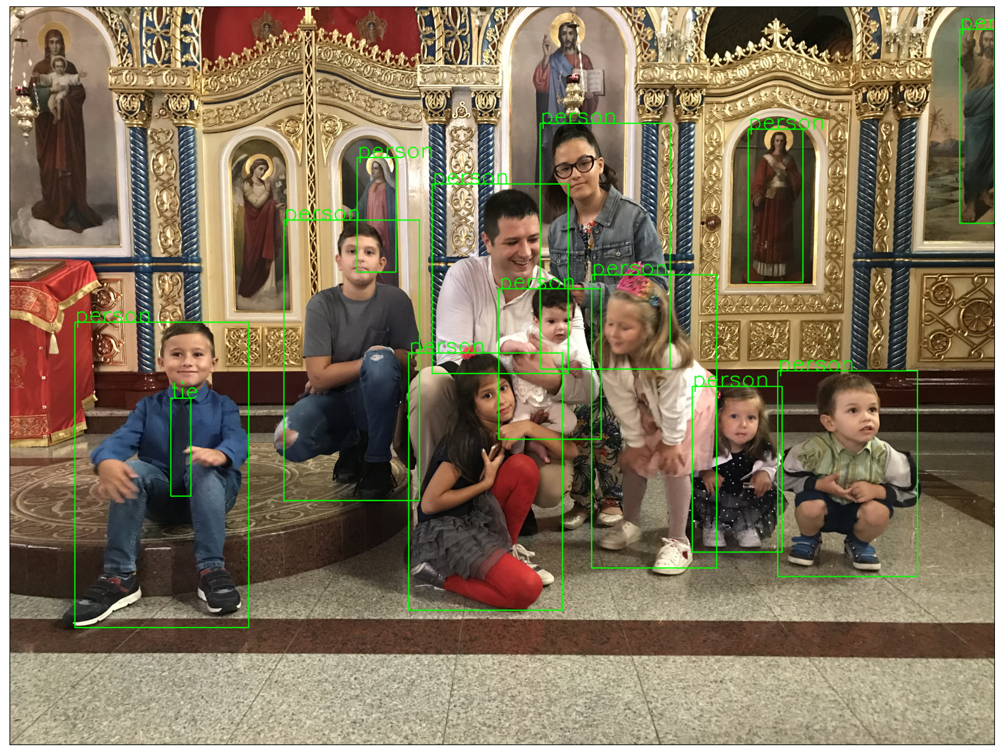

In [3]:

# use the api pipeline for object detection
# the threshold is set manually, the model sometimes predicts
# random structures as a potential object, so we set a threshold to keep objects 
# with better prediction scores.
object_detection_api('./(2019-09-08) (12-43-24) 16640.JPG', threshold=0.8)


In [4]:
get_prediction('./(2019-09-08) (12-43-24) 16640.JPG', threshold=0.8)

([[(267.15143, 1294.7017), (978.90045, 2544.7305)],
  [(1122.6626, 876.5573), (1678.3702, 2024.558)],
  [(3145.2666, 1493.5331), (3716.5847, 2336.1577)],
  [(2795.141, 1558.1755), (3163.1565, 2235.5151)],
  [(1634.3129, 1421.1077), (2264.2205, 2474.426)],
  [(2383.2874, 1101.2981), (2894.7817, 2300.6843)],
  [(659.7883, 1605.5277), (741.9788, 2006.9712)],
  [(2171.5356, 481.0914), (2704.1199, 1487.3782)],
  [(3024.0552, 505.44476), (3247.6167, 1131.2015)],
  [(2002.5864, 1158.0851), (2422.409, 1774.2542)],
  [(1730.224, 728.9017), (2287.3494, 1504.7715)],
  [(3889.5662, 95.78435), (4032.0, 889.5103)],
  [(1422.986, 620.76215), (1581.6326, 1090.2467)]],
 ['person',
  'person',
  'person',
  'person',
  'person',
  'person',
  'tie',
  'person',
  'person',
  'person',
  'person',
  'person',
  'person'])

## Table with drinks and food

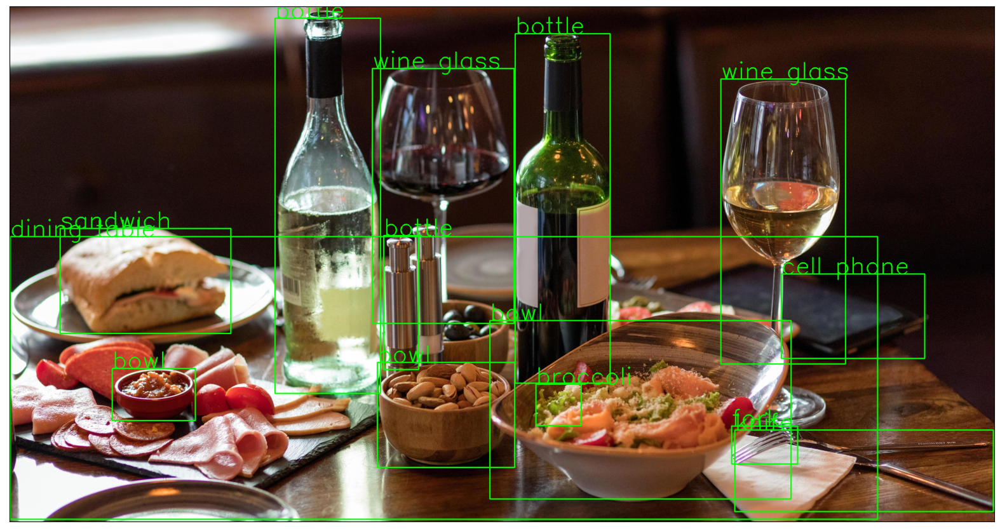

In [11]:
object_detection_api('./table-setting-with-food-and-drink-free-photo.jpg', threshold=0.8)

## ZOO

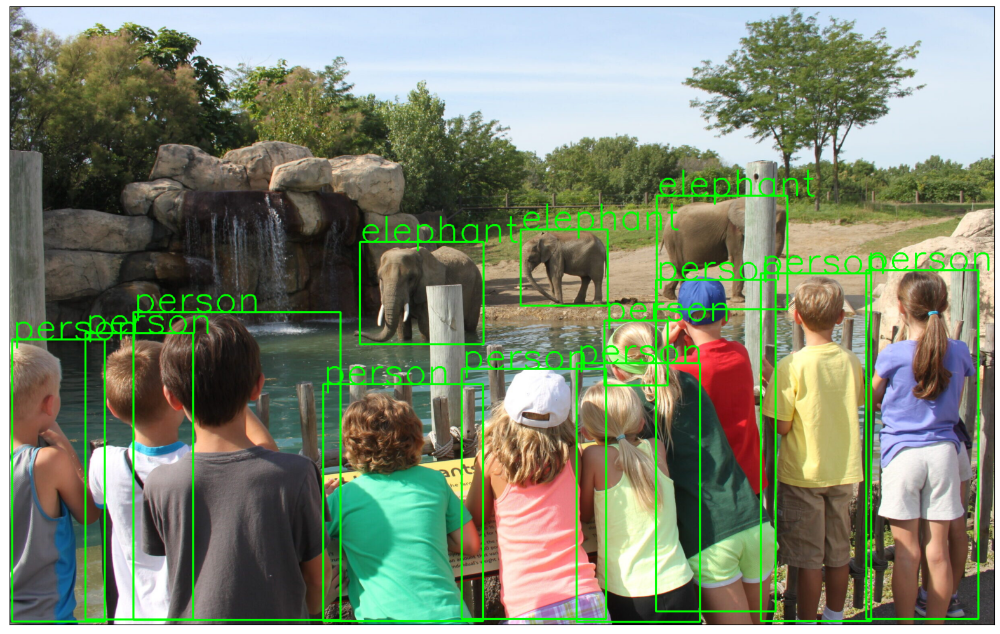

In [13]:
object_detection_api('./zoo.jpg', threshold=0.8)

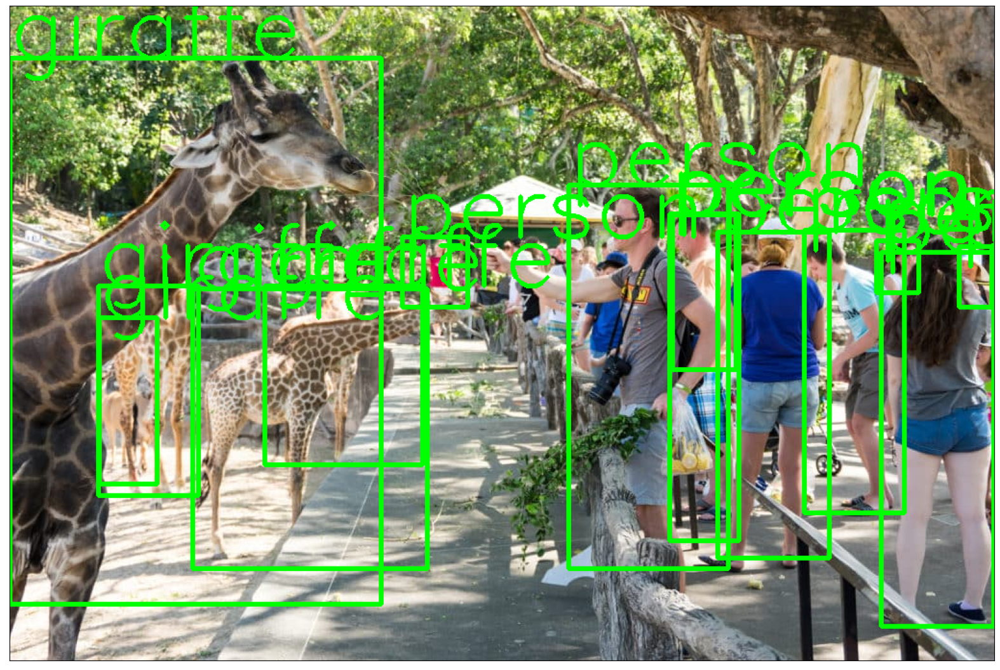

In [16]:
object_detection_api('./zoo_1.jpg', threshold=0.8)

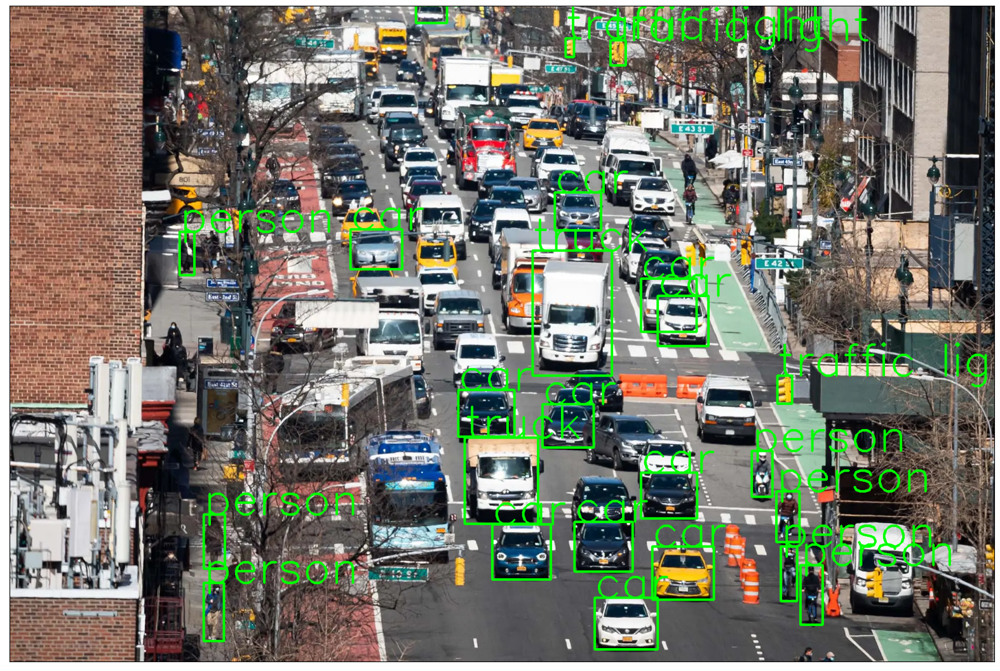

In [18]:
object_detection_api('./traffic_1.jpg', threshold=0.8)